In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

# **H1** : 환경 요인(온도, 풍속 등)은 구조 반응(진동, 하중 등)에 유의미한 영향을 미친다.

# 1. X와 Y구분하기

In [3]:
data = pd.read_csv("C:/Users/thddu/Desktop/데이터분석/진도대교분석/AI_anomalyDetection/data.csv", index_col = 0)

data['X.Time'] = pd.to_datetime(data['X.Time'])
data.rename(columns = {'X.Time' : 'datetime'}, inplace=True)
data.columns

Index(['X', 'ind', 'datetime', 'ACC001_X', 'ACC001_Y', 'ACC001_Z', 'ACC002_Z',
       'ACC003_Z', 'CAC001', 'CAC002',
       ...
       'WGT002_S', 'WGT002_V', 'WVR001_HDR', 'WVR001_HSP', 'WVR001_PDR',
       'WVR001_PSP', 'WVR002_HDR', 'WVR002_HSP', 'WVR002_PDR', 'WVR002_PSP'],
      dtype='object', length=108)

In [4]:
columns = [col for col in data.columns if col not in ['X','ind']]
X_input = []
Y_input = []
for col in columns : 
    if col not in 'datetime' : 
        if col.startswith(('FBT', 'WVR','WGT','EQK','WSP')) : 
            X_input.append(col)
        elif col.startswith(('FBG','DIS','CAC')) : 
            Y_input.append(col)

print(X_input)
print()
print(Y_input)

['EQK_TJAX', 'EQK_TJAY', 'EQK_TJBX', 'EQK_TJBY', 'EQK_TJBZ', 'EQK_TJCX', 'EQK_TJCY', 'EQK_TJDX', 'EQK_TJGE', 'EQK_TJGN', 'EQK_TJGZ', 'EQK_TJHZ', 'EQK_TJPX', 'EQK_TJQY', 'EQK_TJQZ', 'EQK001_X', 'EQK001_Y', 'EQK001_Z', 'FBT001', 'FBT005', 'FBT006', 'FBT007', 'FBT009', 'FBT010', 'FBT011', 'FBT012', 'FBT013', 'FBT014', 'FBT015', 'FBT016', 'FBT017', 'FBT018', 'FBT019', 'FBT020', 'WGT001_D', 'WGT001_S', 'WGT001_V', 'WGT002_D', 'WGT002_S', 'WGT002_V', 'WVR001_HDR', 'WVR001_HSP', 'WVR001_PDR', 'WVR001_PSP', 'WVR002_HDR', 'WVR002_HSP', 'WVR002_PDR', 'WVR002_PSP']

['CAC001', 'CAC002', 'CAC003', 'CAC004', 'CAC005', 'CAC006', 'CAC007', 'CAC008', 'CAC009', 'CAC010', 'CAC011', 'CAC013', 'CAC014', 'CAC015', 'CAC016', 'CAC017', 'CAC018', 'DIS001_Y', 'DIS001_Z', 'FBG001', 'FBG002', 'FBG003', 'FBG004', 'FBG005', 'FBG006', 'FBG007', 'FBG008', 'FBG009', 'FBG010', 'FBG011', 'FBG012', 'FBG013', 'FBG014', 'FBG015', 'FBG016', 'FBG017', 'FBG018', 'FBG019', 'FBG020', 'FBG021', 'FBG022', 'FBG023', 'FBG024']


# 1. 데이터가 8월 ~ 9월은 없어져 있음

In [5]:
## 8월 데이터만 보기
drop_data = data[data['datetime'] >= '2018-08-06']

In [6]:
data.drop(drop_data.index, inplace=True)

In [7]:
# data.drop(columns=['X','ind'], inplace=True)

# 2. 데이터에서 결측치 파악하기 -> 0인 애들은 존재X

In [8]:
# 데이터에서 컬럼별로 결측치 세기
for col in data.columns : 
    data_sum = data[col].isna().sum()
    print(f"{col} : {data_sum}")

X : 0
ind : 0
datetime : 0
ACC001_X : 0
ACC001_Y : 0
ACC001_Z : 0
ACC002_Z : 0
ACC003_Z : 0
CAC001 : 0
CAC002 : 0
CAC003 : 0
CAC004 : 0
CAC005 : 0
CAC006 : 0
CAC007 : 0
CAC008 : 0
CAC009 : 0
CAC010 : 0
CAC011 : 0
CAC013 : 0
CAC014 : 0
CAC015 : 0
CAC016 : 0
CAC017 : 0
CAC018 : 0
DIS001_Y : 0
DIS001_Z : 0
EQK_TJAX : 0
EQK_TJAY : 0
EQK_TJBX : 0
EQK_TJBY : 0
EQK_TJBZ : 0
EQK_TJCX : 0
EQK_TJCY : 0
EQK_TJDX : 0
EQK_TJGE : 0
EQK_TJGN : 0
EQK_TJGZ : 0
EQK_TJHZ : 0
EQK_TJPX : 0
EQK_TJQY : 0
EQK_TJQZ : 0
EQK001_X : 0
EQK001_Y : 0
EQK001_Z : 0
FBG001 : 0
FBG002 : 0
FBG003 : 0
FBG004 : 0
FBG005 : 0
FBG006 : 0
FBG007 : 0
FBG008 : 0
FBG009 : 0
FBG010 : 0
FBG011 : 0
FBG012 : 0
FBG013 : 0
FBG014 : 0
FBG015 : 0
FBG016 : 0
FBG017 : 0
FBG018 : 0
FBG019 : 0
FBG020 : 0
FBG021 : 0
FBG022 : 0
FBG023 : 0
FBG024 : 0
FBT001 : 0
FBT005 : 0
FBT006 : 0
FBT007 : 0
FBT009 : 0
FBT010 : 0
FBT011 : 0
FBT012 : 0
FBT013 : 0
FBT014 : 0
FBT015 : 0
FBT016 : 0
FBT017 : 0
FBT018 : 0
FBT019 : 0
FBT020 : 0
GNS001_X : 0
GNS001_Y

In [9]:
data[['FBG002', 'FBG003']]

,FBG002,FBG003
1,0.0,0.00000
7,0.0,0.00000
8,0.0,0.00000
15,0.0,0.00000
16,0.0,0.00000
...,...,...
20810,0.0,0.00000
20811,0.0,24.18717
20817,0.0,27.76139
20819,0.0,21.10401


In [10]:
# 데이터에서 컬럼별로 0의 개수 세기
for col in data.columns : 
    data_sum = data[col].isna().sum()
    print(f"{col} : {data_sum}")

X : 0
ind : 0
datetime : 0
ACC001_X : 0
ACC001_Y : 0
ACC001_Z : 0
ACC002_Z : 0
ACC003_Z : 0
CAC001 : 0
CAC002 : 0
CAC003 : 0
CAC004 : 0
CAC005 : 0
CAC006 : 0
CAC007 : 0
CAC008 : 0
CAC009 : 0
CAC010 : 0
CAC011 : 0
CAC013 : 0
CAC014 : 0
CAC015 : 0
CAC016 : 0
CAC017 : 0
CAC018 : 0
DIS001_Y : 0
DIS001_Z : 0
EQK_TJAX : 0
EQK_TJAY : 0
EQK_TJBX : 0
EQK_TJBY : 0
EQK_TJBZ : 0
EQK_TJCX : 0
EQK_TJCY : 0
EQK_TJDX : 0
EQK_TJGE : 0
EQK_TJGN : 0
EQK_TJGZ : 0
EQK_TJHZ : 0
EQK_TJPX : 0
EQK_TJQY : 0
EQK_TJQZ : 0
EQK001_X : 0
EQK001_Y : 0
EQK001_Z : 0
FBG001 : 0
FBG002 : 0
FBG003 : 0
FBG004 : 0
FBG005 : 0
FBG006 : 0
FBG007 : 0
FBG008 : 0
FBG009 : 0
FBG010 : 0
FBG011 : 0
FBG012 : 0
FBG013 : 0
FBG014 : 0
FBG015 : 0
FBG016 : 0
FBG017 : 0
FBG018 : 0
FBG019 : 0
FBG020 : 0
FBG021 : 0
FBG022 : 0
FBG023 : 0
FBG024 : 0
FBT001 : 0
FBT005 : 0
FBT006 : 0
FBT007 : 0
FBT009 : 0
FBT010 : 0
FBT011 : 0
FBT012 : 0
FBT013 : 0
FBT014 : 0
FBT015 : 0
FBT016 : 0
FBT017 : 0
FBT018 : 0
FBT019 : 0
FBT020 : 0
GNS001_X : 0
GNS001_Y

In [11]:
data_notime = data.drop(columns='datetime')
data_notime

,X,ind,ACC001_X,ACC001_Y,ACC001_Z,ACC002_Z,ACC003_Z,CAC001,CAC002,CAC003,...,WGT002_S,WGT002_V,WVR001_HDR,WVR001_HSP,WVR001_PDR,WVR001_PSP,WVR002_HDR,WVR002_HSP,WVR002_PDR,WVR002_PSP
1,2029,2029,40.805119,25.504034,0.416799,974.861377,1003.282507,712.910132,707.205802,347.641772,...,1.813764,0.289230,7.401429,0.424711,116.731682,3.260048,89.110220,60.459179,272.565559,0.995250
7,2069,2069,40.827409,25.699538,0.758546,974.872434,1003.569013,712.738905,706.851693,347.931524,...,1.606156,0.312017,14.887839,0.439992,147.398011,1.670779,89.241007,60.369046,261.912444,0.857520
8,2091,2091,40.807949,25.851085,0.664547,974.777937,1003.794401,712.730147,706.634184,348.467358,...,0.955877,0.169726,9.712352,0.134816,198.366212,0.827321,89.370690,60.502694,280.931183,0.696128
15,2146,2146,40.980717,26.277307,1.573698,974.768914,1004.406324,712.621695,706.231516,349.356274,...,2.585505,0.166486,16.055534,0.734244,296.837162,2.585418,88.674855,60.469280,93.611917,1.421831
16,2151,2151,40.993807,26.313338,1.639161,974.710911,1004.481729,712.663076,706.231409,349.273731,...,1.925782,0.316285,10.667167,0.430964,280.470441,2.179158,88.331297,60.458463,98.351081,1.768940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20810,310873,310873,47.063350,37.608800,24.084510,975.903500,1011.503000,719.131000,703.935900,354.622900,...,4.459070,0.758011,33.804950,58.635600,43.854710,87.572420,4.328674,0.188933,107.635200,2.497962
20811,310906,310906,47.109420,37.886910,24.571920,975.947500,1011.714000,715.883300,703.480400,354.340500,...,4.257908,0.724023,34.080270,59.035290,43.882190,87.259480,6.126695,0.167006,117.565200,1.566566
20817,310958,310958,47.271080,38.030180,25.175790,975.912600,1011.976000,716.328700,703.421000,354.642500,...,4.844986,0.657744,34.499880,59.281260,44.131800,86.255270,3.954036,0.178802,258.945700,2.918412
20819,310966,310966,47.299670,38.056200,25.242680,975.950500,1012.006000,716.276400,703.363300,354.585000,...,4.422633,0.545220,34.590390,59.376510,44.368820,86.102060,5.668641,0.242369,278.838900,2.644720


In [12]:
# 데이터에서 컬럼별로 0의 개수 세기
for col in data_notime.columns : 
    zero_count = (data_notime[col] == 0).sum()
    print(f"{col} : {zero_count}")

X : 0
ind : 0
ACC001_X : 0
ACC001_Y : 0
ACC001_Z : 0
ACC002_Z : 0
ACC003_Z : 0
CAC001 : 0
CAC002 : 0
CAC003 : 0
CAC004 : 0
CAC005 : 0
CAC006 : 0
CAC007 : 0
CAC008 : 0
CAC009 : 0
CAC010 : 0
CAC011 : 0
CAC013 : 0
CAC014 : 0
CAC015 : 0
CAC016 : 0
CAC017 : 0
CAC018 : 0
DIS001_Y : 0
DIS001_Z : 0
EQK_TJAX : 0
EQK_TJAY : 0
EQK_TJBX : 0
EQK_TJBY : 0
EQK_TJBZ : 0
EQK_TJCX : 0
EQK_TJCY : 0
EQK_TJDX : 0
EQK_TJGE : 0
EQK_TJGN : 0
EQK_TJGZ : 0
EQK_TJHZ : 0
EQK_TJPX : 0
EQK_TJQY : 0
EQK_TJQZ : 0
EQK001_X : 0
EQK001_Y : 0
EQK001_Z : 0
FBG001 : 5162
FBG002 : 8050
FBG003 : 6054
FBG004 : 45
FBG005 : 30
FBG006 : 0
FBG007 : 0
FBG008 : 0
FBG009 : 0
FBG010 : 0
FBG011 : 27
FBG012 : 0
FBG013 : 0
FBG014 : 6
FBG015 : 0
FBG016 : 0
FBG017 : 16
FBG018 : 0
FBG019 : 2
FBG020 : 302
FBG021 : 0
FBG022 : 0
FBG023 : 14
FBG024 : 0
FBT001 : 0
FBT005 : 0
FBT006 : 0
FBT007 : 0
FBT009 : 0
FBT010 : 0
FBT011 : 0
FBT012 : 0
FBT013 : 0
FBT014 : 0
FBT015 : 0
FBT016 : 0
FBT017 : 0
FBT018 : 0
FBT019 : 0
FBT020 : 0
GNS001_X : 0
GNS00

In [13]:
data.drop(columns=['X','ind'], inplace=True)

In [14]:
# 결측치가 없음
print(data.isna().sum().sum())


0


# IQR을 활용해 전처리 진행 -> 정규성을 만족시키지 않는 데이터 분포가 많기에 정규성이 전제되는 z-score나 표준편차 기반 필터링 무의미 -> IQR은 데이터의 순위만을 이용하기에 활용

In [15]:
for col in data.columns : 
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3-Q1
    data = data[(data[col] >= Q1 - 1.5*IQR) & (data[col] <= Q3 + 1.5*IQR)]

In [16]:
data.describe()

,datetime,ACC001_X,ACC001_Y,ACC001_Z,ACC002_Z,ACC003_Z,CAC001,CAC002,CAC003,CAC004,...,WGT002_S,WGT002_V,WVR001_HDR,WVR001_HSP,WVR001_PDR,WVR001_PSP,WVR002_HDR,WVR002_HSP,WVR002_PDR,WVR002_PSP
count,695,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,695.000000,...,695.000000,695.000000,6.950000e+02,6.950000e+02,6.950000e+02,6.950000e+02,695.000000,695.000000,695.000000,695.000000
mean,2018-05-05 17:57:54.043165440,44.505171,30.092165,12.285384,974.885751,1007.294111,712.964111,706.266146,350.350616,381.162132,...,1.278876,0.186096,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,89.229362,53.751566,203.131027,0.758946
min,2018-03-26 21:43:00,42.648750,28.296360,7.549417,974.647000,1005.739000,712.533200,704.148400,348.341300,378.855400,...,0.049990,0.022085,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,87.766450,52.450570,46.319780,0.056833
25%,2018-04-25 22:30:30,44.073140,29.371290,10.579200,974.793750,1006.762000,712.788800,705.465700,349.774350,380.459700,...,0.551813,0.116000,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,88.948420,53.481560,110.777150,0.391160
50%,2018-05-07 10:42:00,44.475010,29.949310,11.924730,974.858400,1007.238000,712.878300,705.907400,350.279400,381.110600,...,1.104943,0.175562,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,89.343960,53.810640,243.156600,0.659129
75%,2018-05-18 09:17:00,44.962870,30.725830,14.174285,974.976150,1007.804500,713.081950,706.576950,350.956450,381.909650,...,1.846783,0.244241,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,89.611355,54.083770,272.424400,1.044863
max,2018-05-30 08:29:00,45.828340,32.262310,17.424370,975.231800,1009.118000,714.589900,710.525500,352.752200,384.165100,...,4.225472,0.473897,3.526291e+01,6.022963e+01,2.250157e+02,8.518222e+01,89.952130,54.646220,322.073000,2.130426
std,NaN,0.667010,0.922363,2.245643,0.124077,0.714530,0.269253,1.323117,0.810799,0.962929,...,0.897449,0.092352,3.057534e-13,9.314814e-13,4.266327e-13,8.106021e-13,0.488144,0.425563,78.515148,0.464640


In [17]:
# 데이터에서 컬럼별로 0의 개수 세기
for col in data.columns : 
    zero_count = (data[col] == 0).sum()
    print(f"{col} : {zero_count}")

datetime : 0
ACC001_X : 0
ACC001_Y : 0
ACC001_Z : 0
ACC002_Z : 0
ACC003_Z : 0
CAC001 : 0
CAC002 : 0
CAC003 : 0
CAC004 : 0
CAC005 : 0
CAC006 : 0
CAC007 : 0
CAC008 : 0
CAC009 : 0
CAC010 : 0
CAC011 : 0
CAC013 : 0
CAC014 : 0
CAC015 : 0
CAC016 : 0
CAC017 : 0
CAC018 : 0
DIS001_Y : 0
DIS001_Z : 0
EQK_TJAX : 0
EQK_TJAY : 0
EQK_TJBX : 0
EQK_TJBY : 0
EQK_TJBZ : 0
EQK_TJCX : 0
EQK_TJCY : 0
EQK_TJDX : 0
EQK_TJGE : 0
EQK_TJGN : 0
EQK_TJGZ : 0
EQK_TJHZ : 0
EQK_TJPX : 0
EQK_TJQY : 0
EQK_TJQZ : 0
EQK001_X : 0
EQK001_Y : 0
EQK001_Z : 0
FBG001 : 609
FBG002 : 695
FBG003 : 695
FBG004 : 0
FBG005 : 0
FBG006 : 0
FBG007 : 0
FBG008 : 0
FBG009 : 0
FBG010 : 0
FBG011 : 0
FBG012 : 0
FBG013 : 0
FBG014 : 0
FBG015 : 0
FBG016 : 0
FBG017 : 0
FBG018 : 0
FBG019 : 0
FBG020 : 0
FBG021 : 0
FBG022 : 0
FBG023 : 0
FBG024 : 0
FBT001 : 0
FBT005 : 0
FBT006 : 0
FBT007 : 0
FBT009 : 0
FBT010 : 0
FBT011 : 0
FBT012 : 0
FBT013 : 0
FBT014 : 0
FBT015 : 0
FBT016 : 0
FBT017 : 0
FBT018 : 0
FBT019 : 0
FBT020 : 0
GNS001_X : 0
GNS001_Y : 0
GNS

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

In [19]:
data_dist = data.drop(columns = 'datetime')

In [20]:
print(data_dist.isna().sum().sum())

0


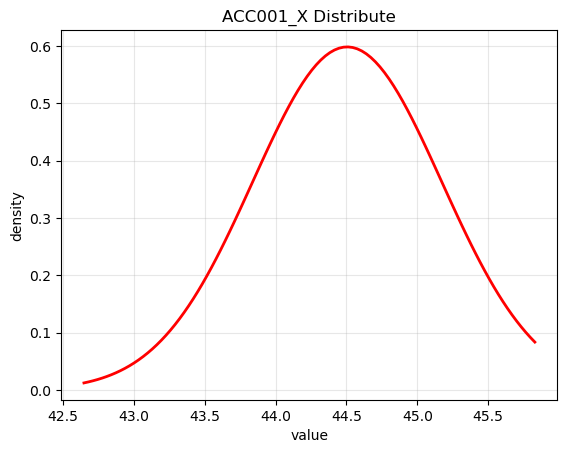

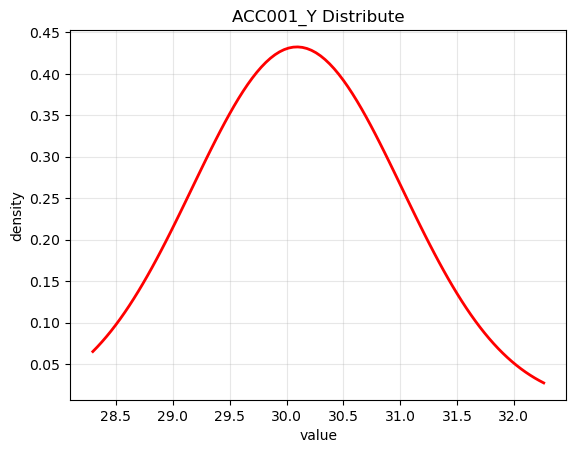

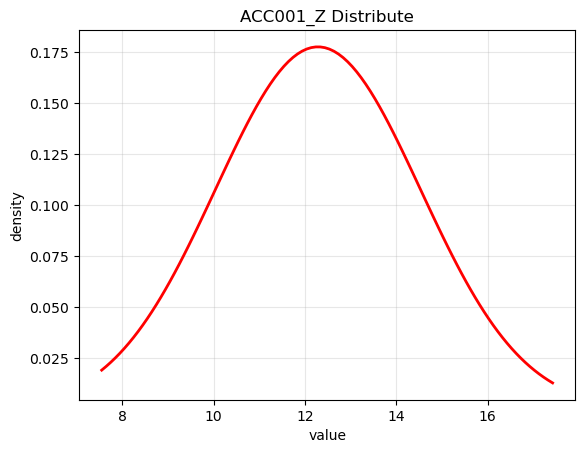

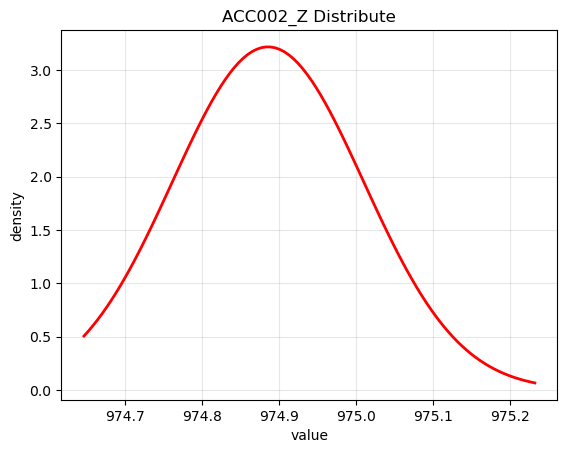

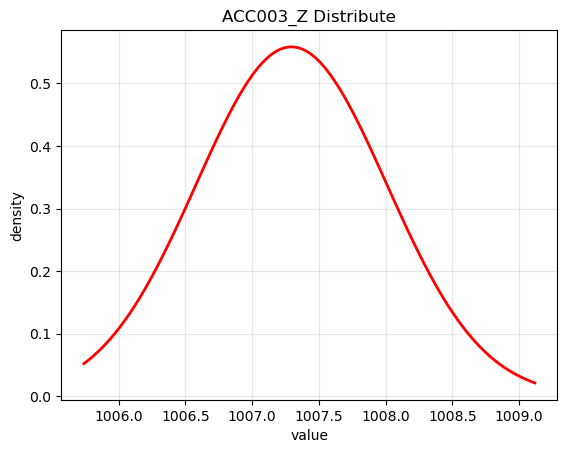

...

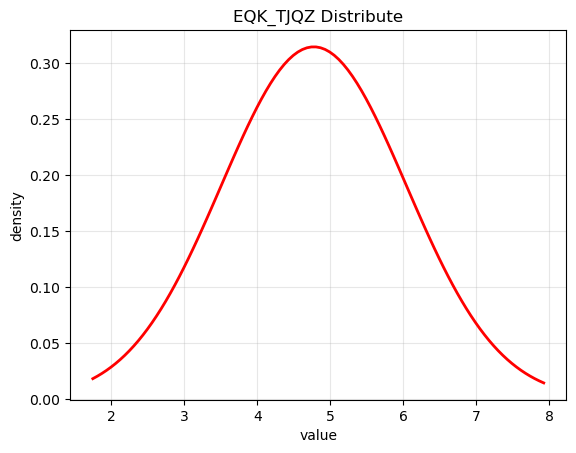

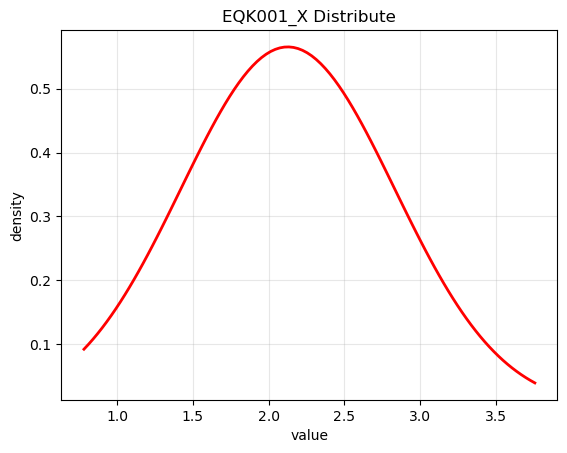

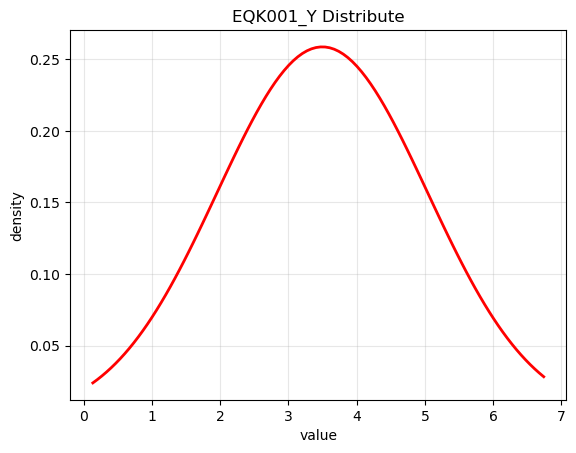

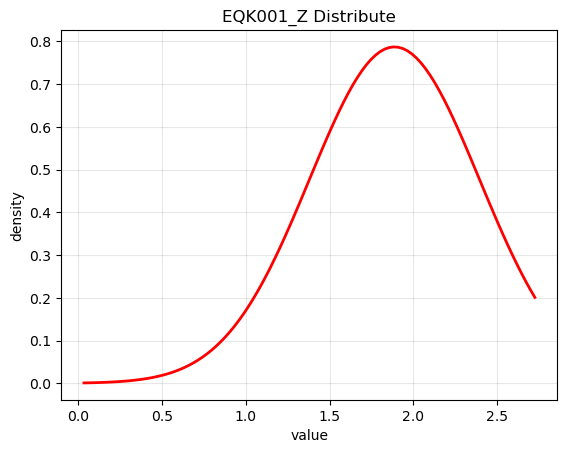

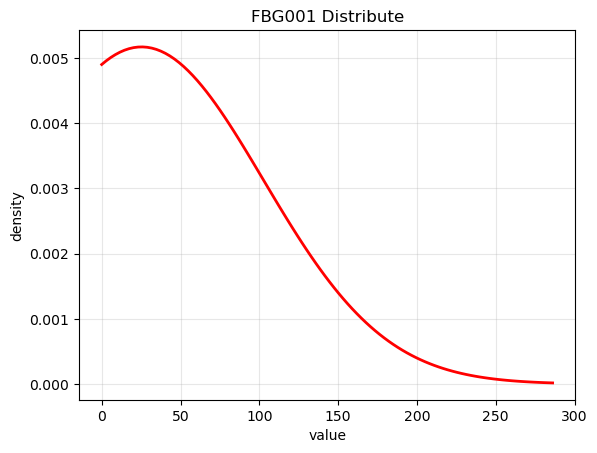

c:\Users\thddu\anaconda3\envs\data_analysis\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2065: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


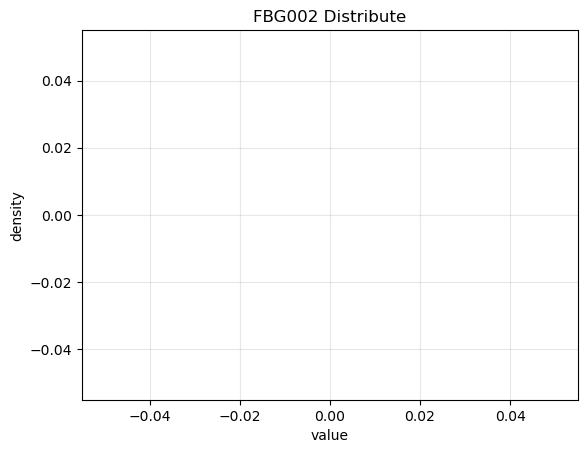

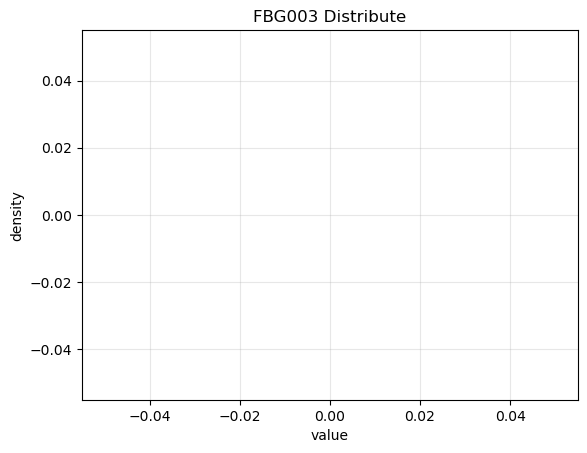

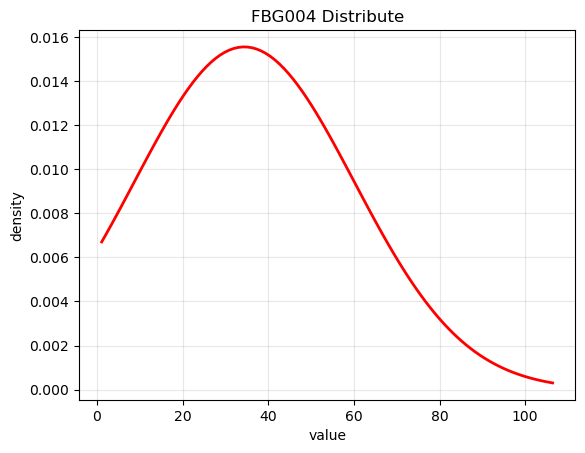

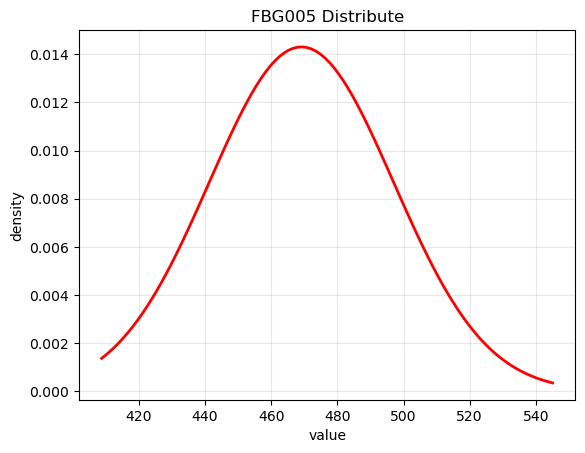

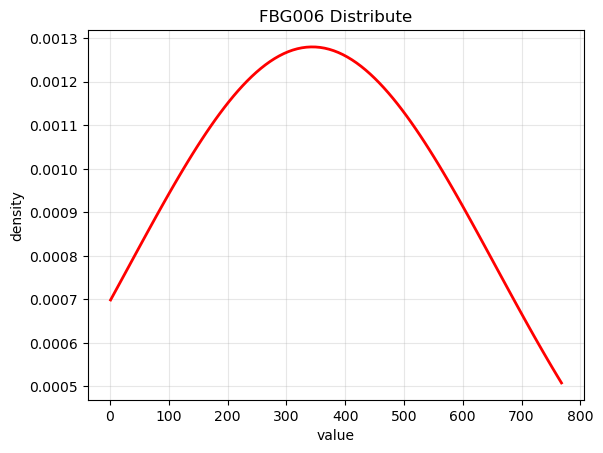

...

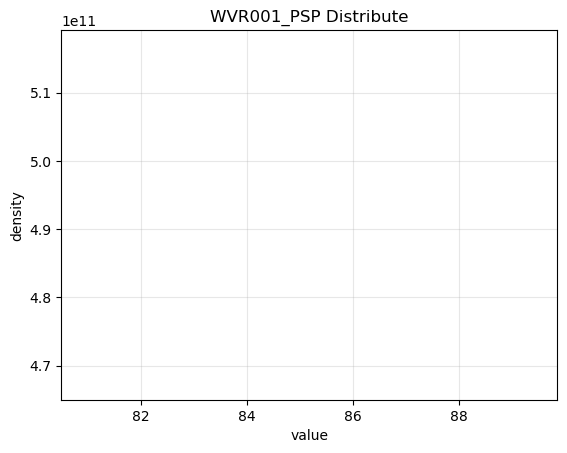

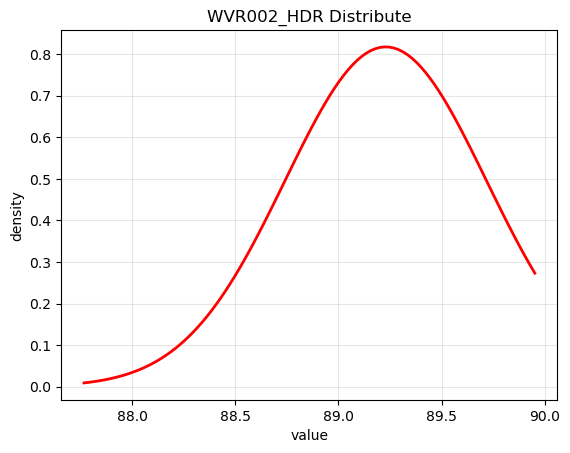

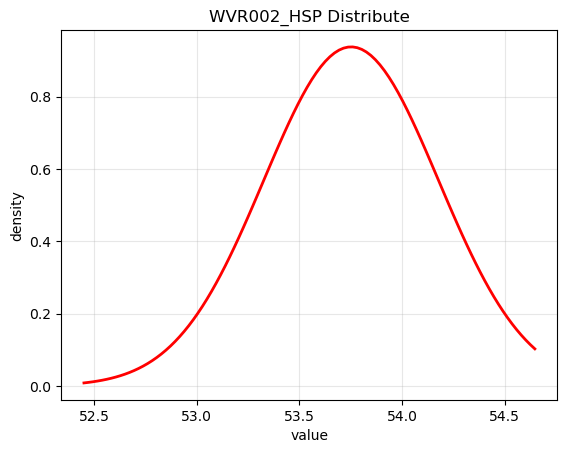

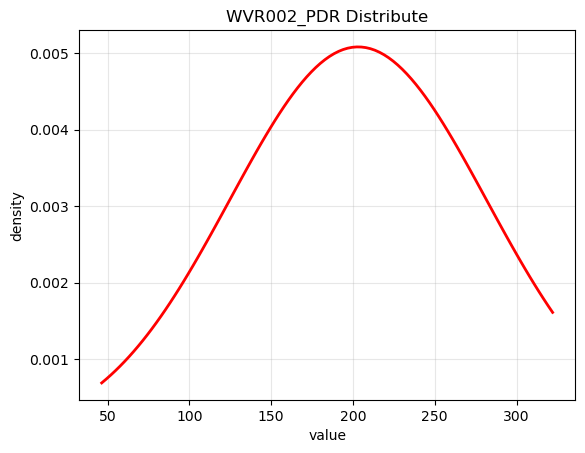

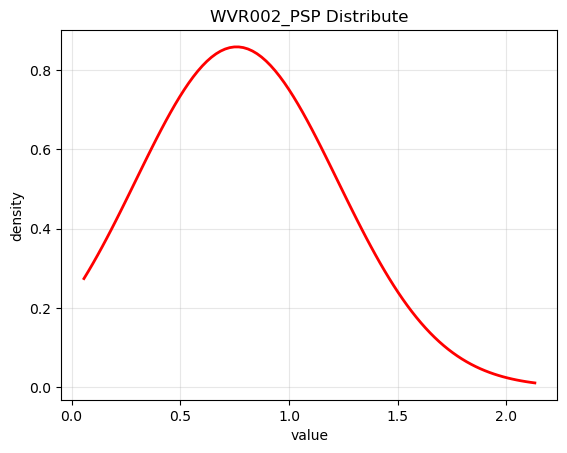

In [21]:
for col in data_dist.columns : 
    mu = data_dist[col].mean()
    sigma = data_dist[col].std()
    x = np.linspace(data_dist[col].min(), data_dist[col].max(), 100)
    y = stats.norm.pdf(x, mu, sigma)
    plt.plot(x,y, 'r-', linewidth=2)
    plt.title(f"{col} Distribute")
    plt.xlabel("value")
    plt.ylabel("density")
    plt.grid(True, alpha=0.3)
    plt.show()

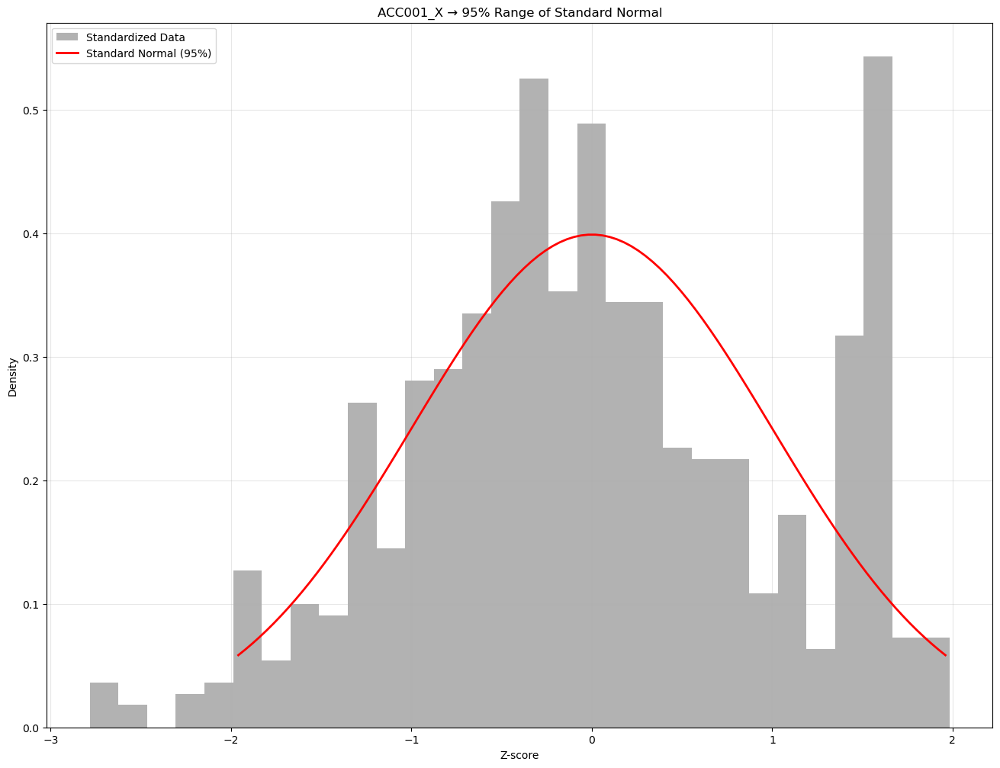

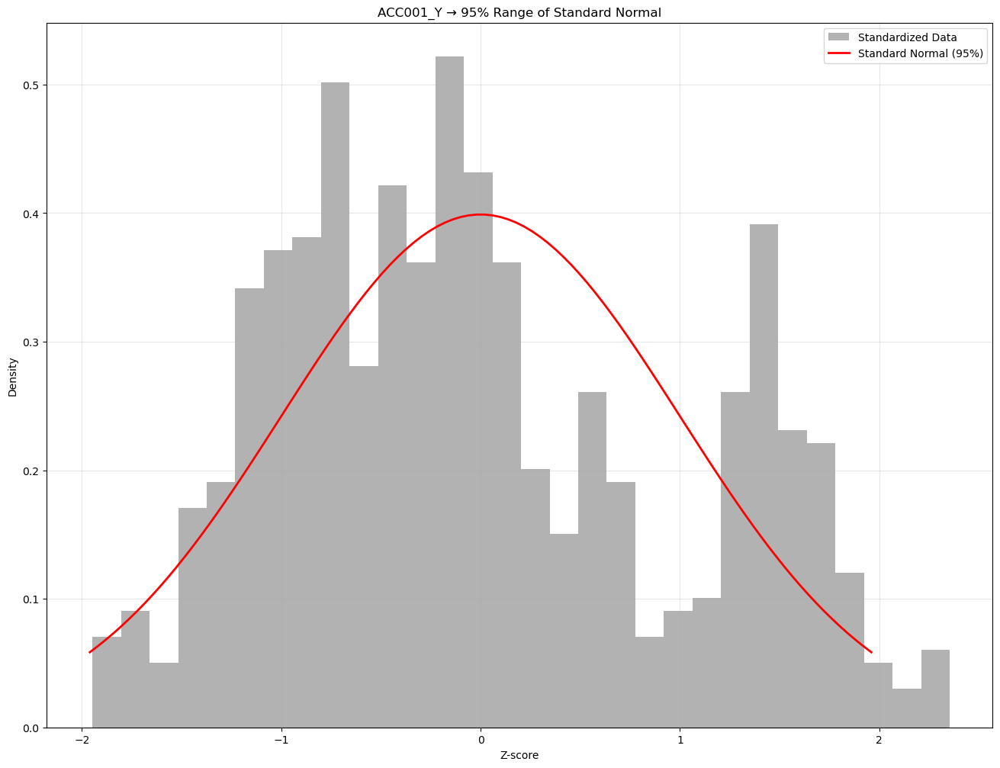

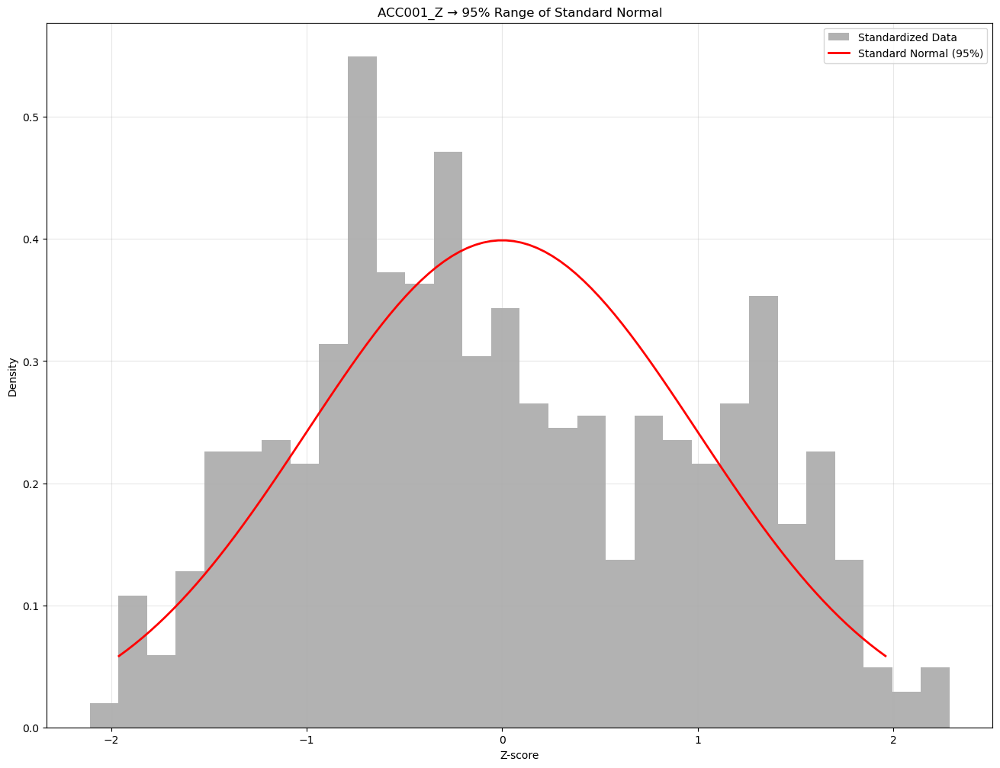

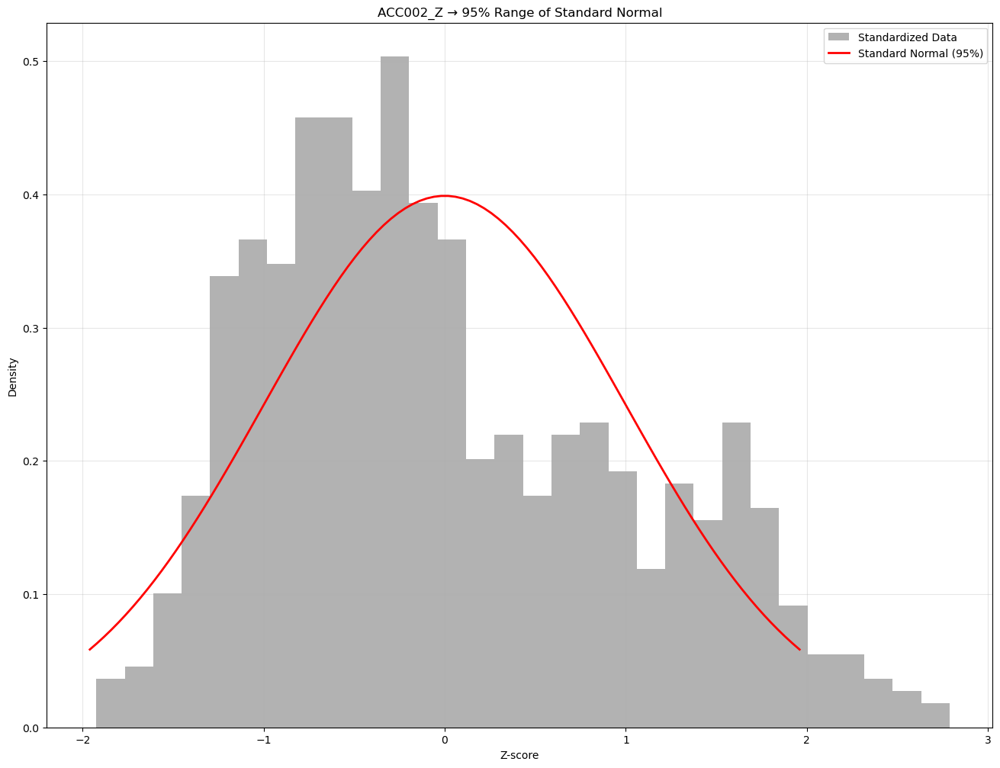

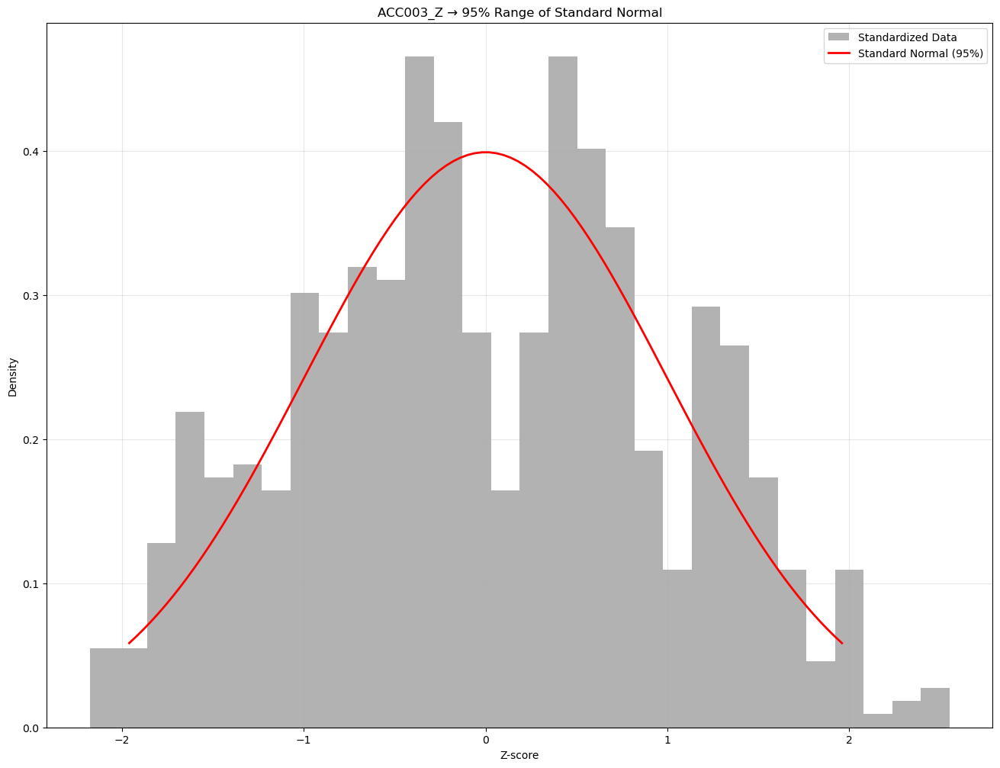

...

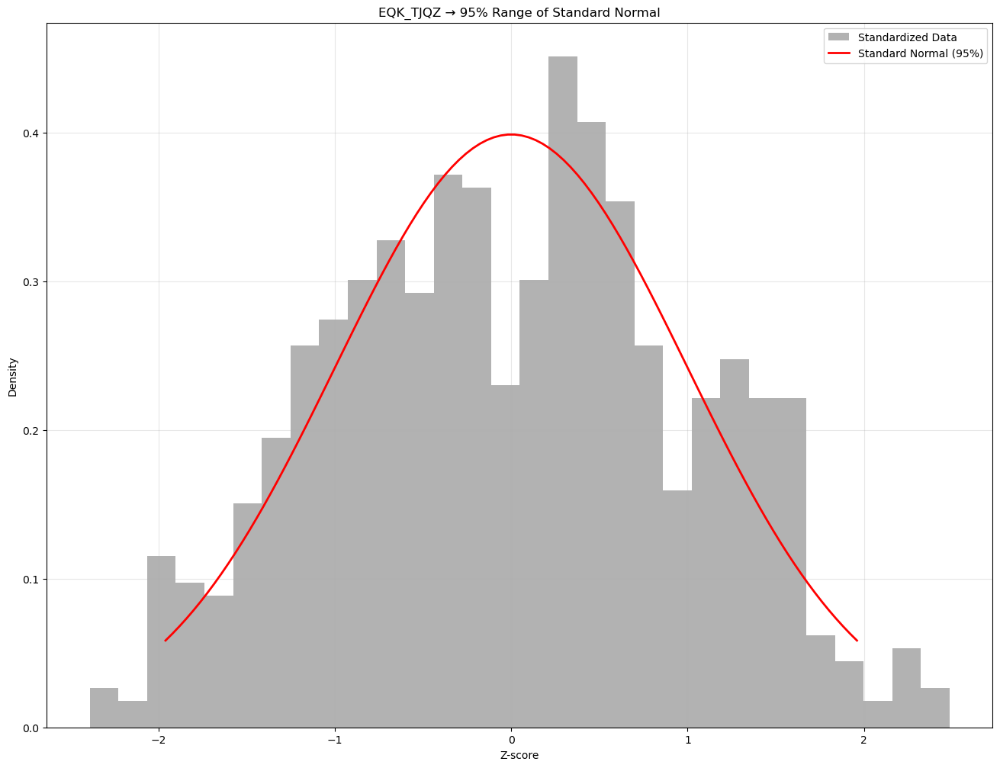

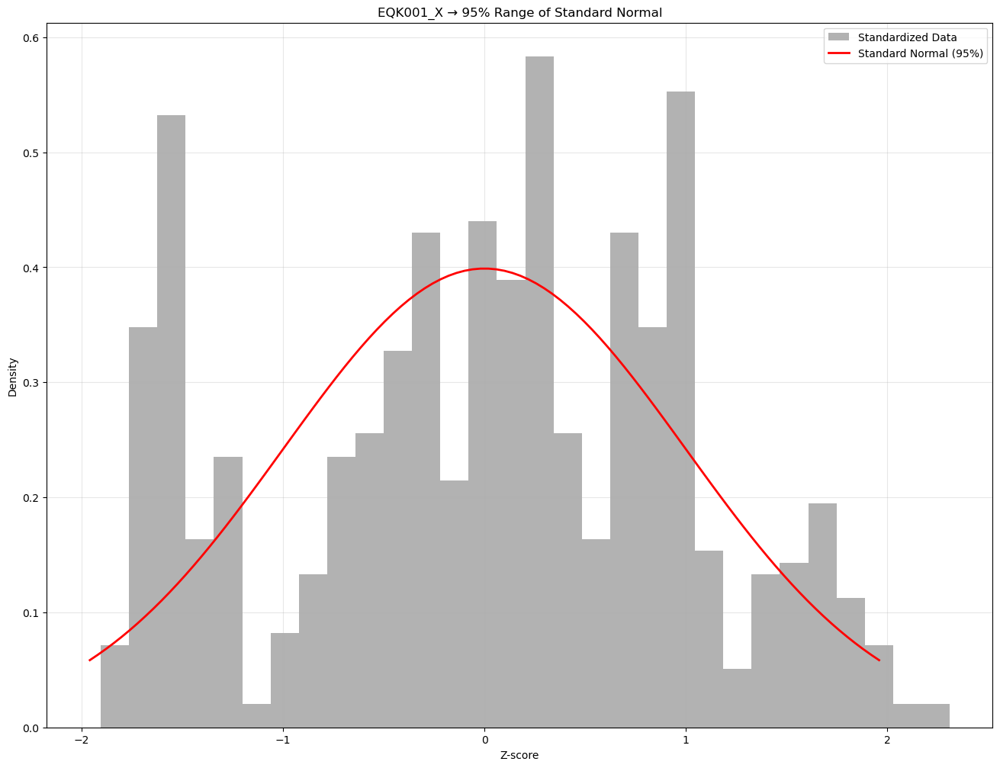

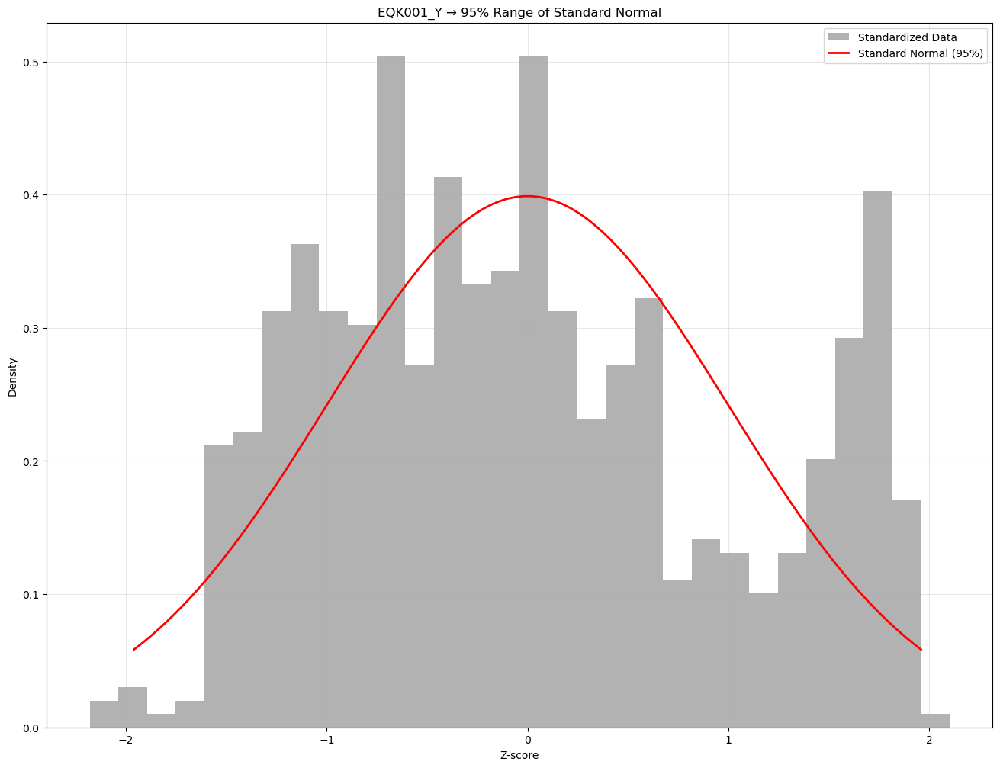

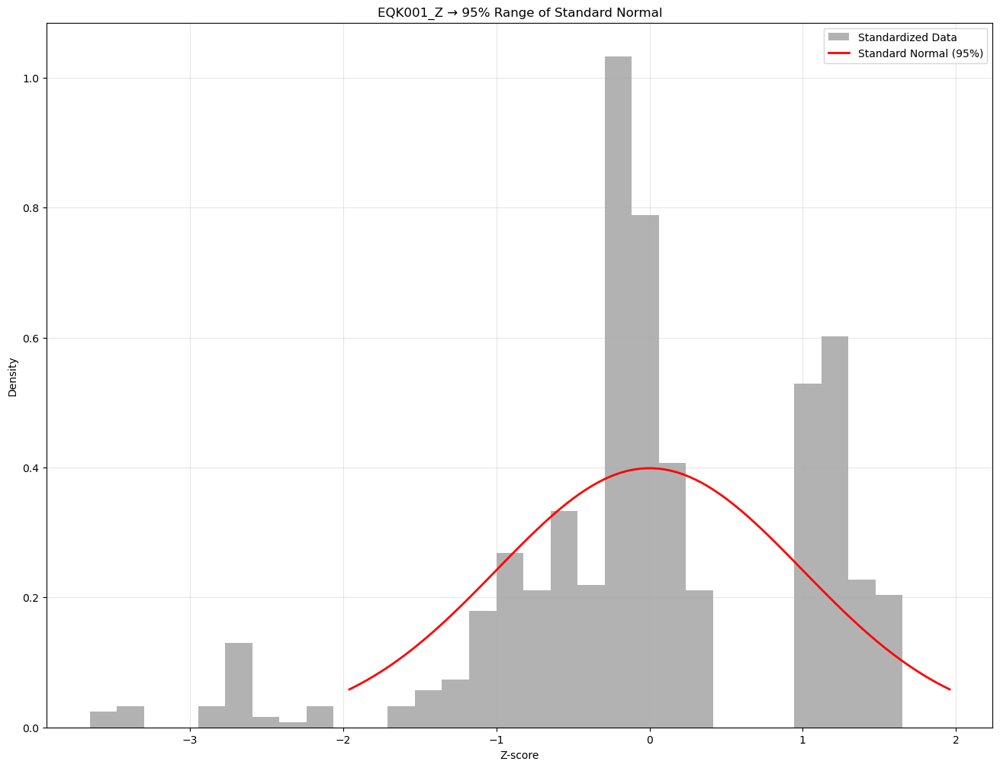

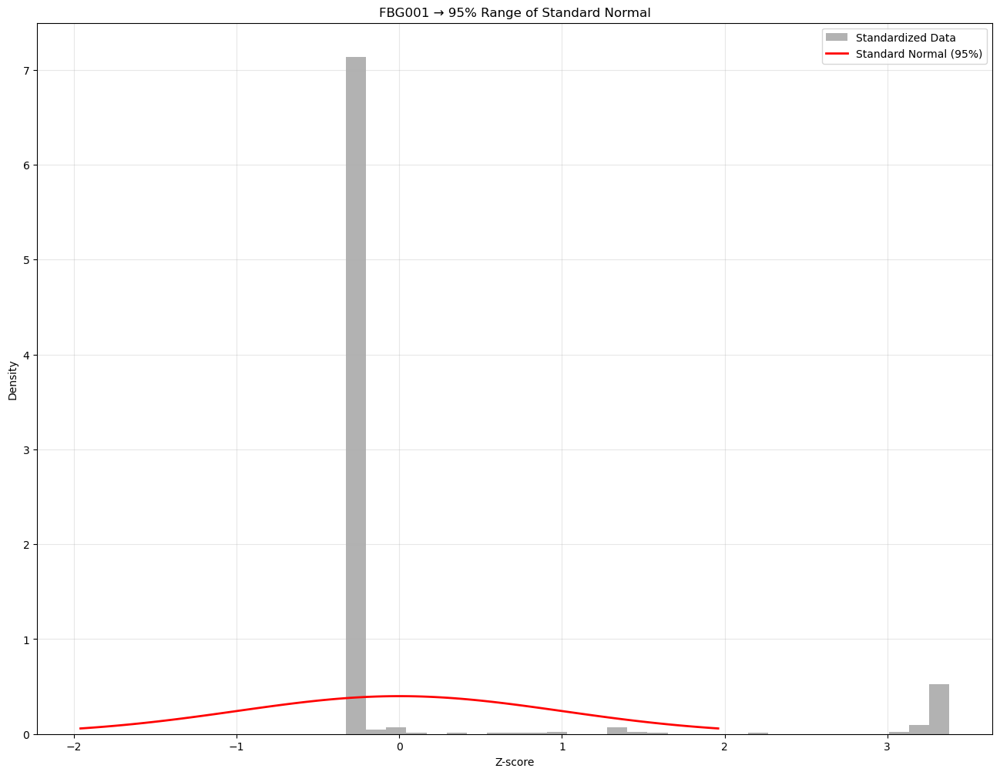

FBG002 표준편차가 0이라서 건너뜀
FBG003 표준편차가 0이라서 건너뜀


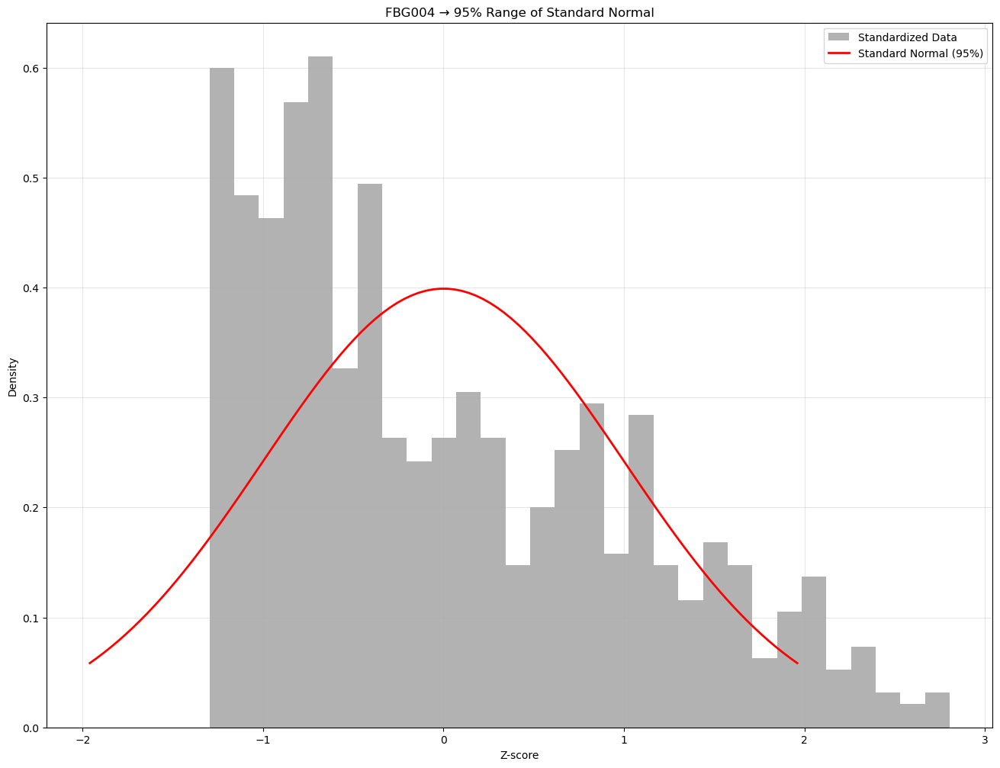

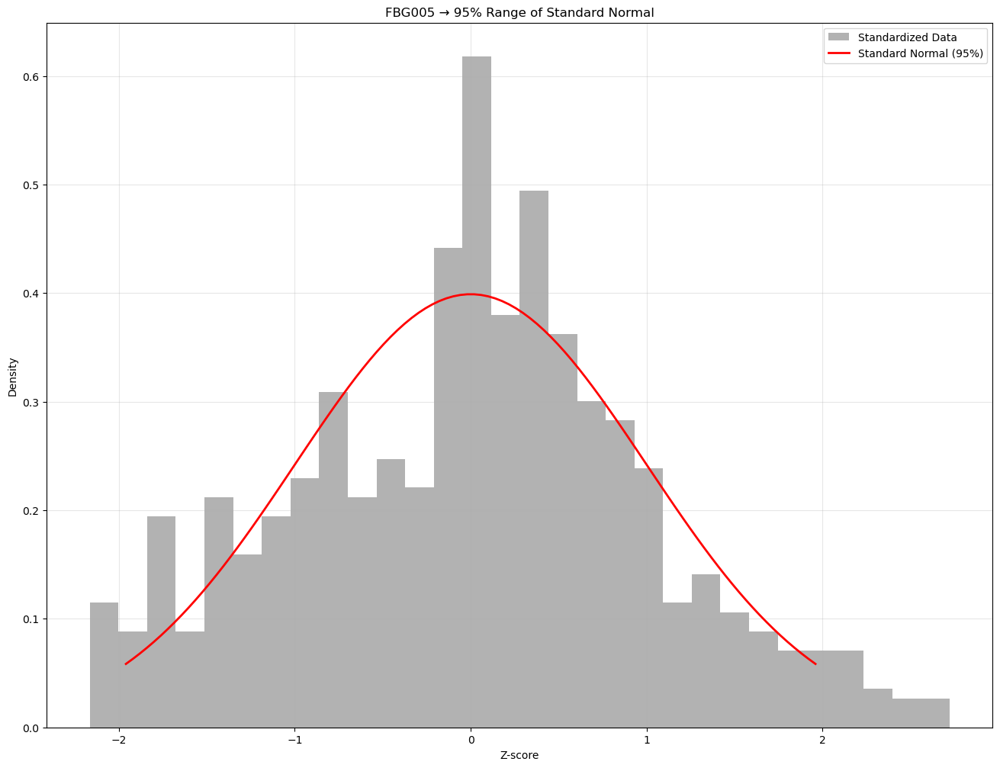

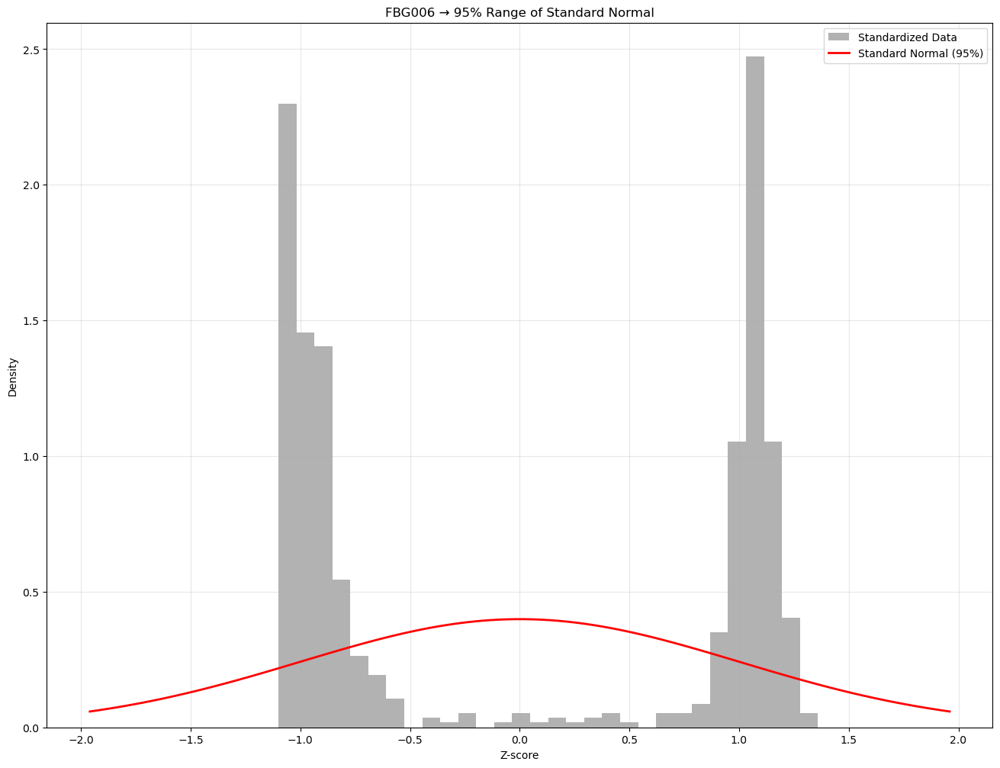

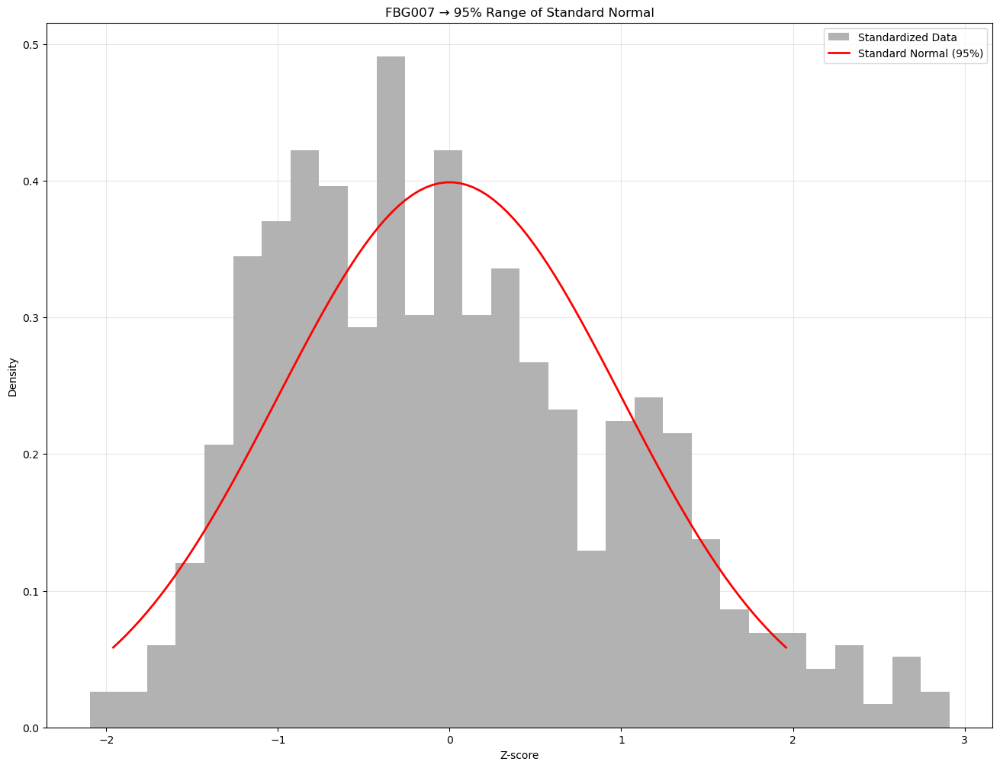

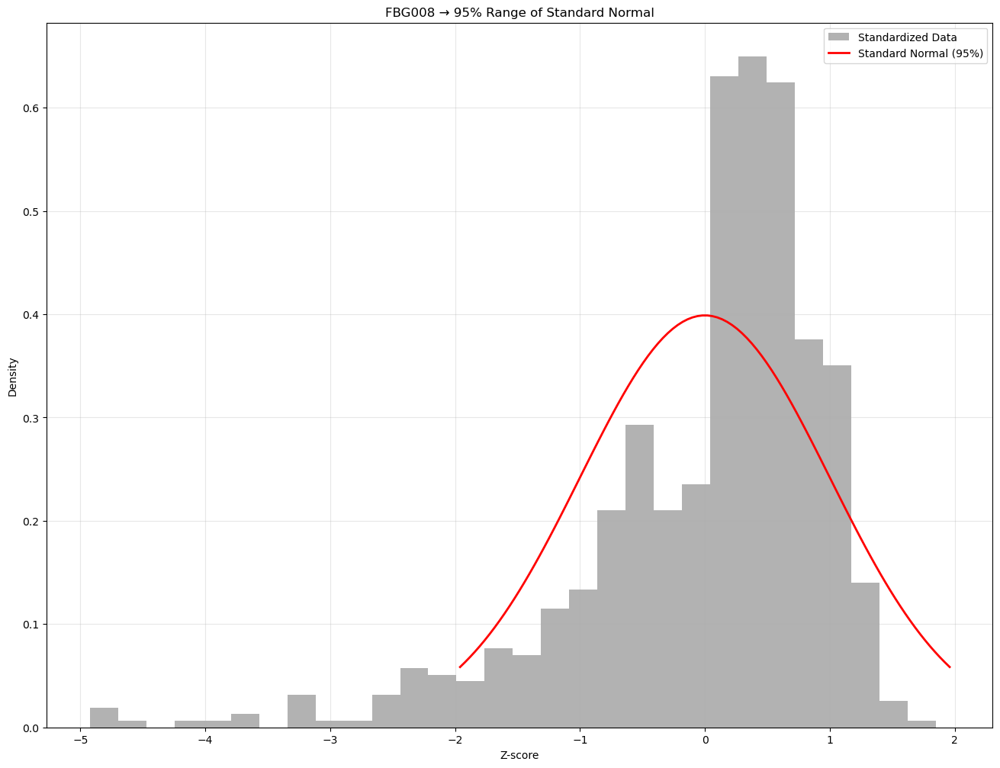

...

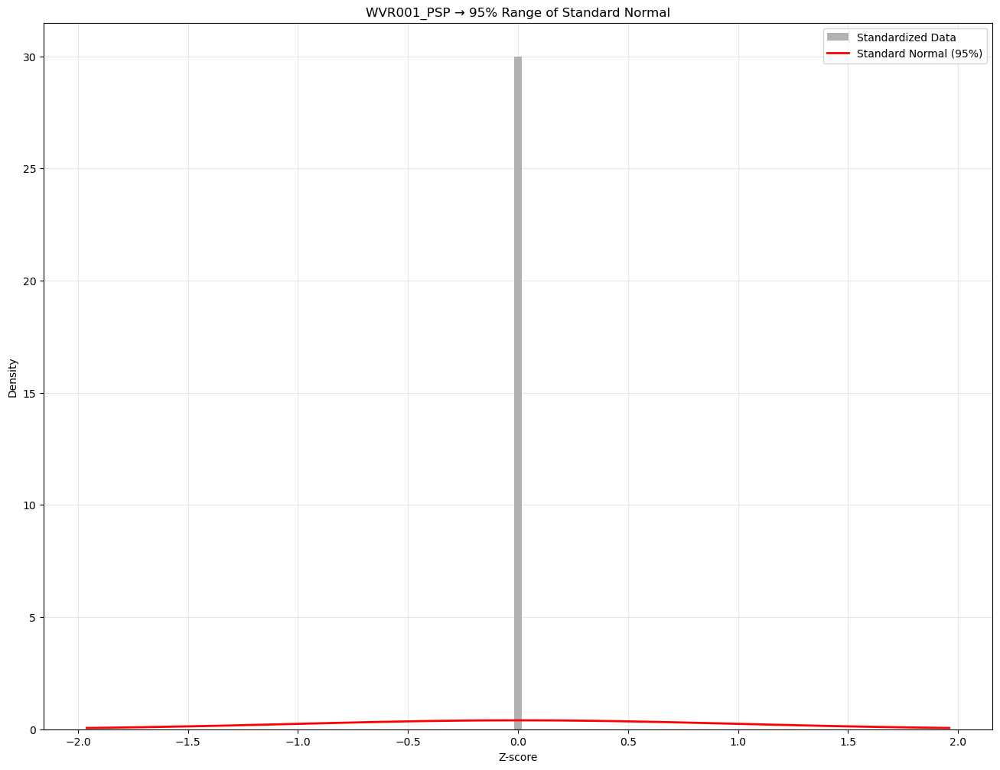

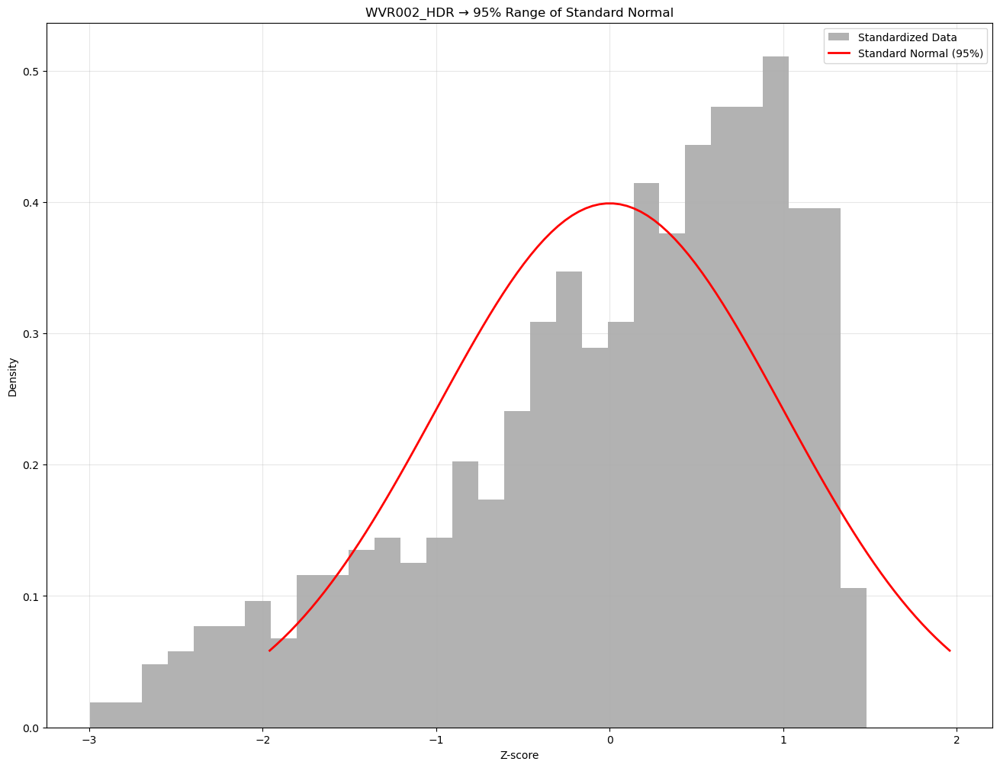

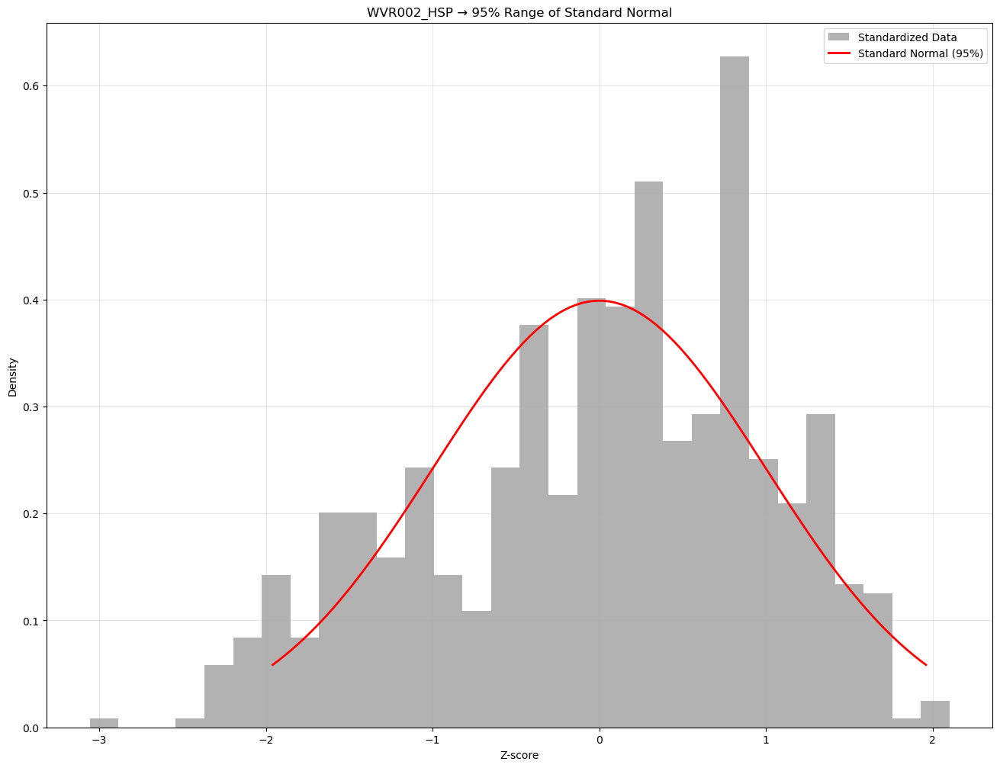

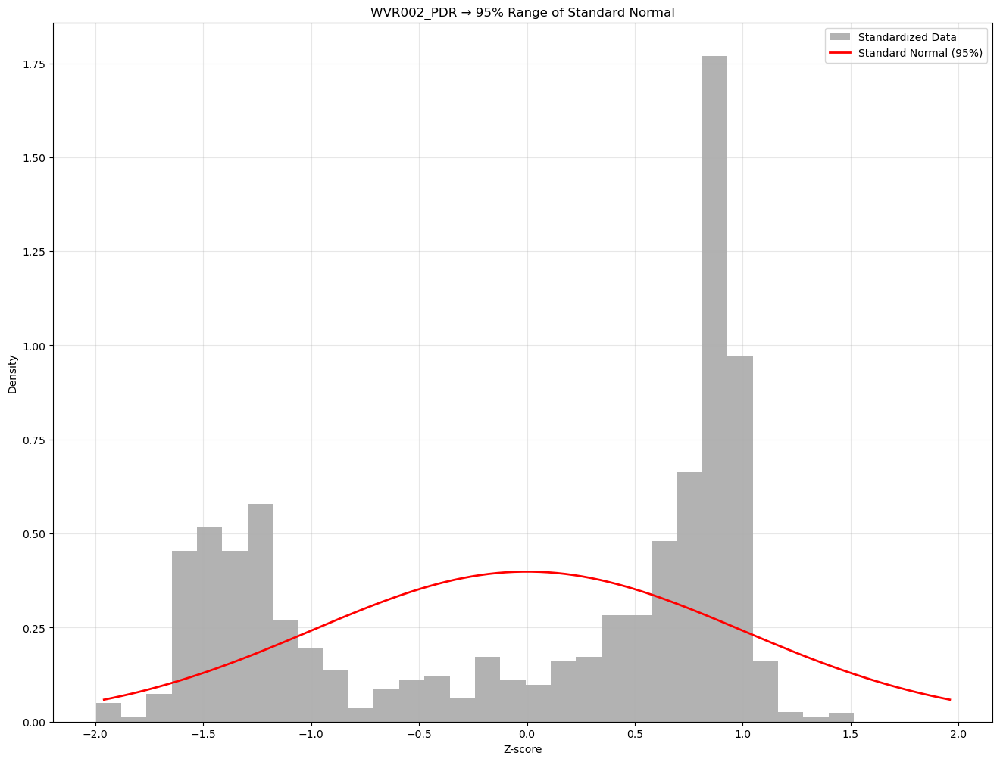

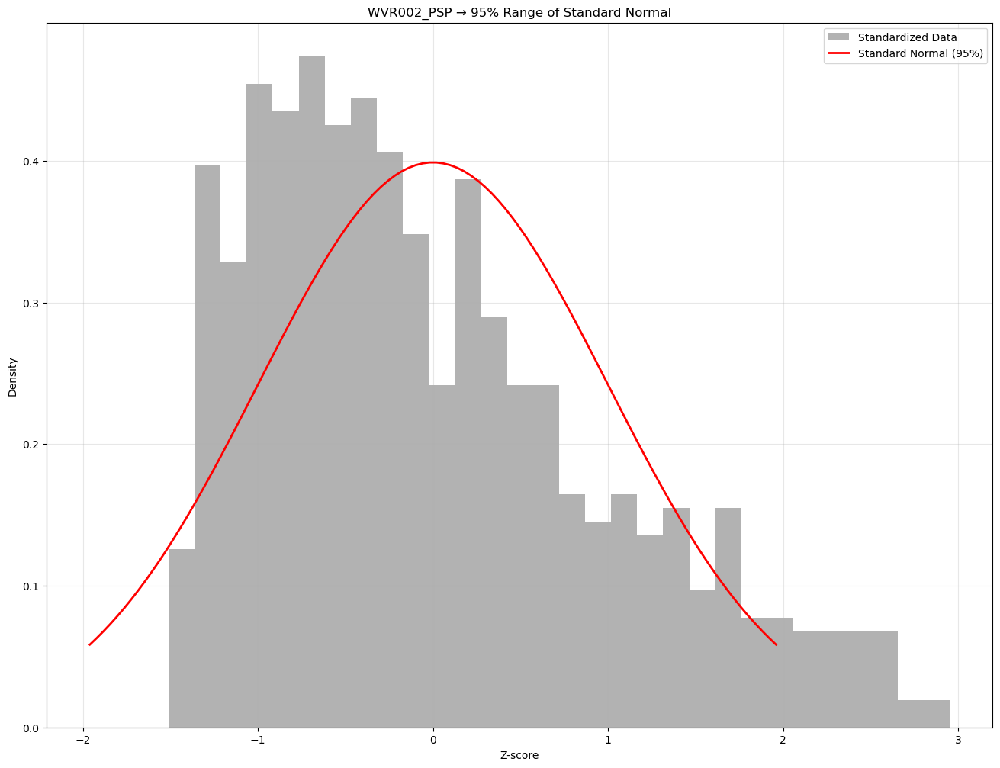

In [22]:
for col in data_dist.columns : 

    series = data_dist[col].dropna()
    sigma = series.std()

    if sigma == 0 or not np.isfinite(sigma) : 
        print(f"{col} 표준편차가 0이라서 건너뜀")
        continue
    
    # z-score
    z = ((data_dist[col]) - (data_dist[col].mean())) / data_dist[col].std()
    
    # 표준정규분포
    x = np.linspace(-1.96, 1.96, 100)
    y = stats.norm.pdf(x,0,1)
    
    # 시각화
    plt.figure(figsize=(16,12))
    plt.hist(z, bins=30, density=True, alpha=0.6, color='gray', label='Standardized Data')
    plt.plot(x, y, 'r-', linewidth=2, label='Standard Normal (95%)')
    plt.title(f"{col} → 95% Range of Standard Normal")
    plt.xlabel("Z-score")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


In [23]:
data_dist['WVR001_PSP'].describe()

count    6.950000e+02
mean     8.518222e+01
std      8.106021e-13
min      8.518222e+01
25%      8.518222e+01
50%      8.518222e+01
75%      8.518222e+01
max      8.518222e+01
Name: WVR001_PSP, dtype: float64

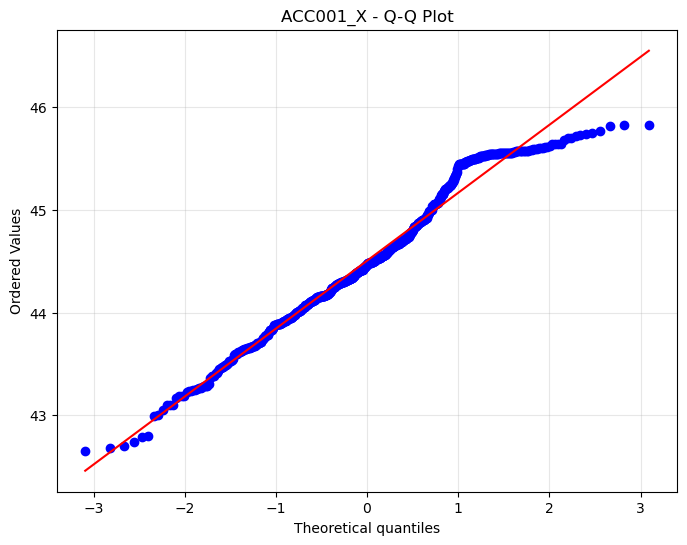

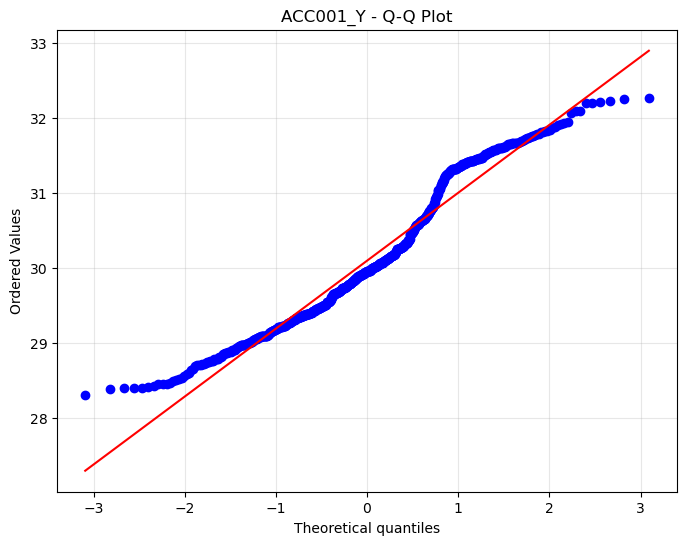

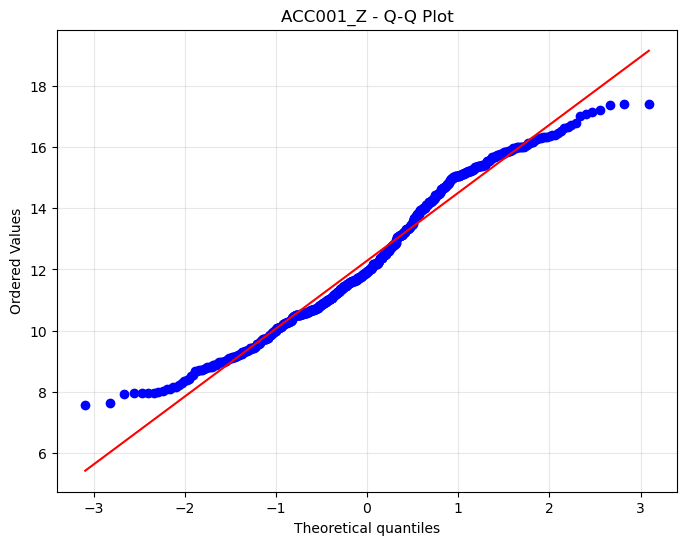

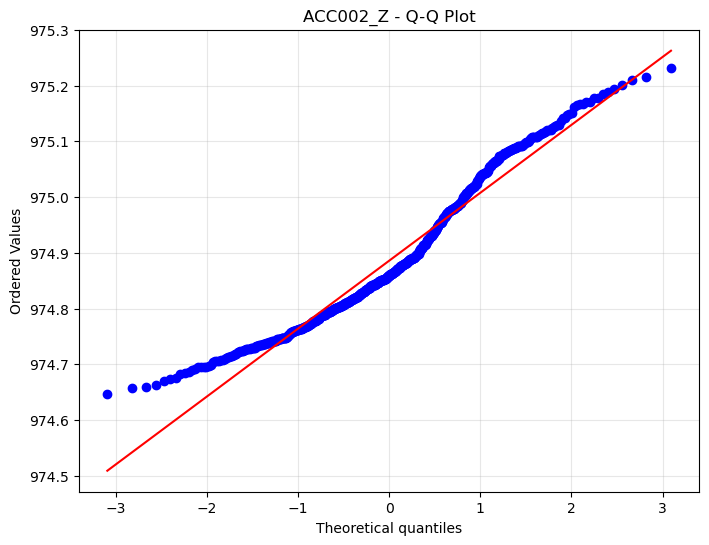

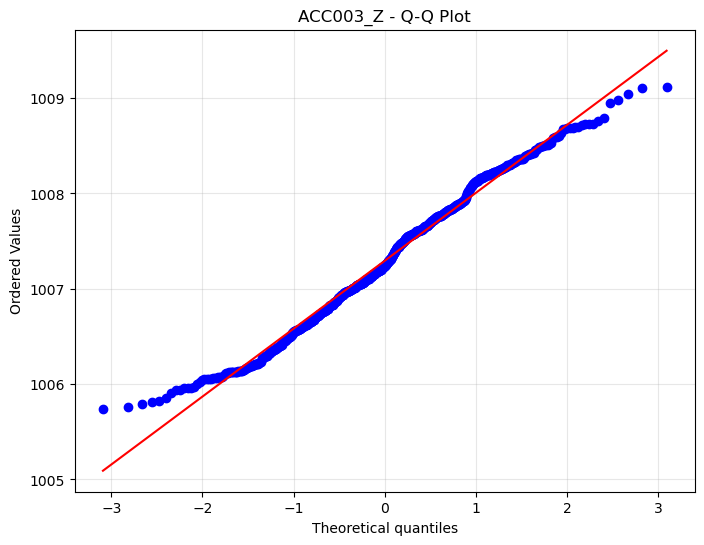

...

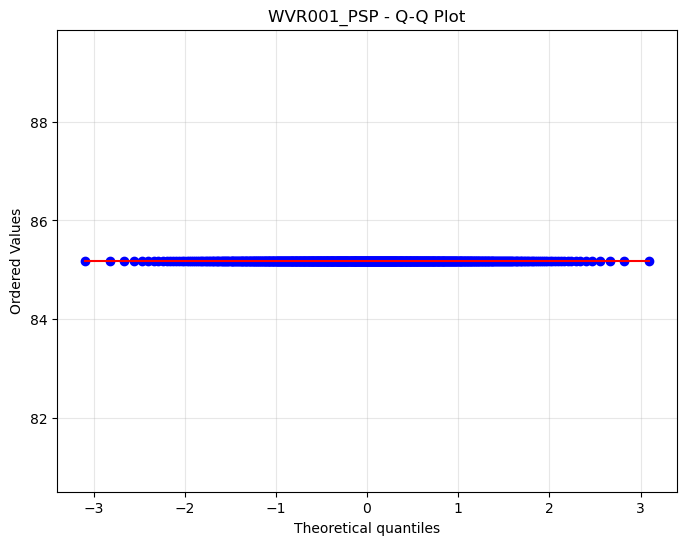

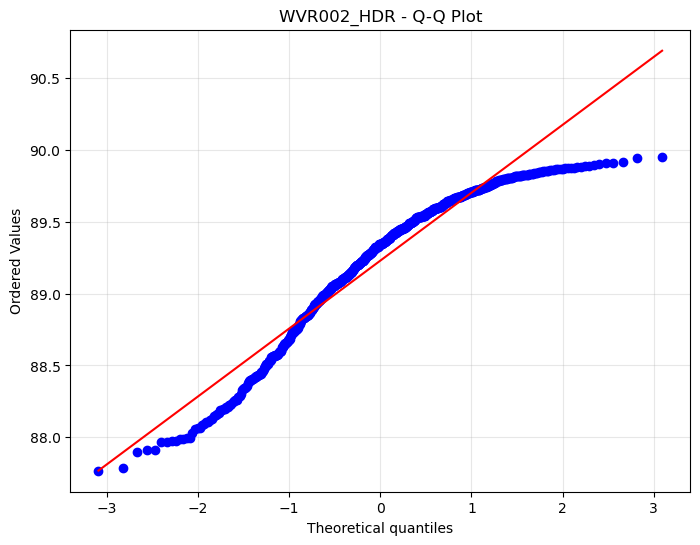

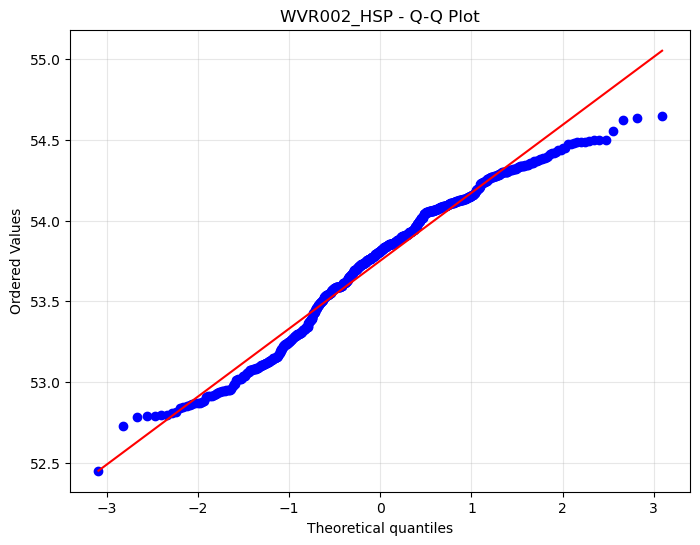

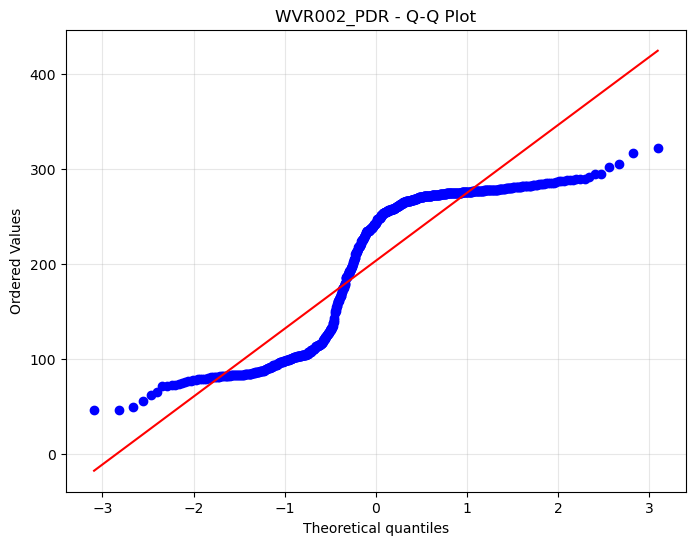

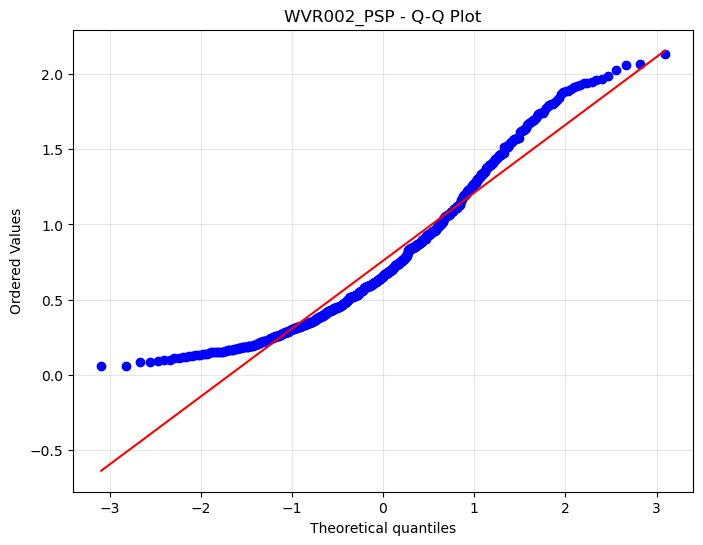

In [24]:
from scipy.stats import probplot

for col in columns : 
    if col not in 'datetime' : 
        plt.figure(figsize=(8, 6))
        probplot(data[col], dist="norm", plot=plt)
        plt.title(f'{col} - Q-Q Plot')
        plt.grid(True, alpha=0.3)
        plt.show()

In [27]:
print("Hello")

Hello
